<a href="https://colab.research.google.com/github/Pierre-code7/Interesting-Projects-OpenCV/blob/main/PointRemarquables.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [How to train Detectron2 with Custom COCO Datasets](https://www.dlology.com/blog/how-to-train-detectron2-with-custom-coco-datasets/) | DLology

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This notebook will help you get started with this framwork by training a instance segmentation model with your custom COCO datasets.

# Install detectron2

In [1]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.7/dist-packages (1.9.0+cu102)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.7/dist-packages (0.10.0+cu102)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-4c5sumqx
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-4c5sumqx
     |████████████████████████████████| 645kB 10.9MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-cp37-none-any.whl size=64501 sha256=347992142782005a153a1e9d8d2f5711b184a3550d45fbc21b0da482de61dc34
  Stored in directory: /tmp/pip-ephem-wheel-cache-gljtu4yi/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
Successfully built fvcore
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


'1.9.0+cu102'

In [2]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 12555, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 12555 (delta 18), reused 28 (delta 11), pack-reused 12506
Receiving objects: 100% (12555/12555), 5.26 MiB | 25.52 MiB/s, done.
Resolving deltas: 100% (8967/8967), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 81kB 5.9MB/s 
     |████████████████████████████████| 153kB 44.7MB/s 
     |████████████████████████████████| 133kB 56.1MB/s 
     |████████████████████████████████| 112kB 55.1MB/s 
     |████████████████████████████████| 727kB 48.0MB/s 
     |████████████████████████████████| 747kB 36.6MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-cp37-none-any.whl size=141231 sha256=b7db98e1e7ba2feef9ba2710f1656910ca7078baf89b1bb691bf6f0e3550e91c
  Stored in directory: /root/.cache/pip/wheels/e3/e2/fa/b78480b448b8579ddf393bebd3f47ee2

In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.structures import BoxMode
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

# Load and Register Keypoints Datset from my ooogle Drive


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


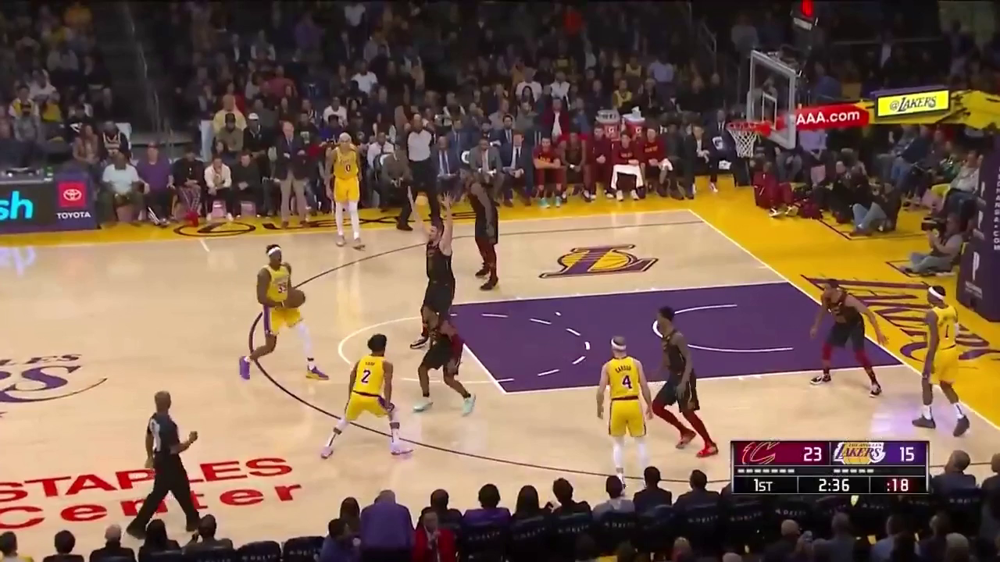

In [ ]:
# im = cv2.imread("/content/drive/MyDrive/consultant/Mini-map/lakersimg2.png") #img1 img2
# cv2_imshow(im)

#Grab the first frame of the video
cap = cv2.VideoCapture('/content/drive/MyDrive/consultant/Mini-map/lakers.mp4')
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)) 
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
ret, im = cap.read()
if ret:
        cv2_imshow( im)

In [ ]:
#get the predictor
cfg = get_cfg()
def get_predictor():
    # add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
    cfg.merge_from_file("/content/drive/MyDrive/consultant/Segmentation_data/config_new.yml")
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85  # set threshold for this model
    # Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
    cfg.MODEL.WEIGHTS = cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/consultant/Segmentation_data/model_final_new.pth"
    predictor = DefaultPredictor(cfg)
    return predictor

The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:115

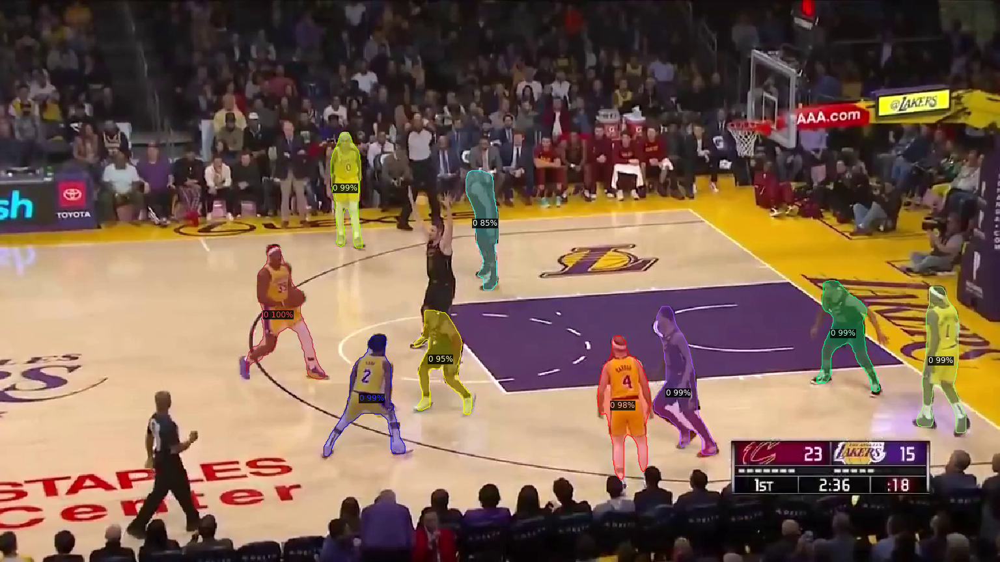

In [ ]:
predictor = get_predictor()
outputs = predictor(im)
# create new instance obj and set its fields
cls = outputs['instances'].pred_classes
scores = outputs["instances"].scores
masks = outputs['instances'].pred_masks #only the masks of the detection
boxes = outputs['instances'].pred_boxes
obj = detectron2.structures.Instances(image_size=(im.shape[0], im.shape[1]))
obj.set('pred_classes', cls)
obj.set('scores', scores)
obj.set('pred_masks', masks)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2, instance_mode=ColorMode.IMAGE_BW)
out = v.draw_instance_predictions(obj.to("cpu"))
#out = v.draw_instance_predictions(outputs['instances'].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
#register_coco_instances(f"test", {}, f"/content/drive/MyDrive/consultant/segmentation_data/Players-Segmentation-project-v2.zip (Unzipped Files)/test.json", f"/content/drive/MyDrive/consultant/segmentation_data/Players-Segmentation-project-v2.zip (Unzipped Files)/")

In [28]:
import random
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances

# #dataset_dicts = DatasetCatalog.get("players_")
# cat_train_dataset = MetadataCatalog.get("players_")


def my_train_function():
  return cat_train_dataset
def my_test_function():
  return cat_test_dataset

DatasetCatalog.clear()
MetadataCatalog.clear()

register_coco_instances(f"p", {}, f"/content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/keypoints-2.json", f"/content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/")

dataset_dicts = DatasetCatalog.get("p")
metadata = MetadataCatalog.get("p")



WARNING [07/19 10:28:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/19 10:28:57 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/keypoints-2.json


WARNING [07/19 10:29:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/19 10:29:17 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/keypoints-2.json


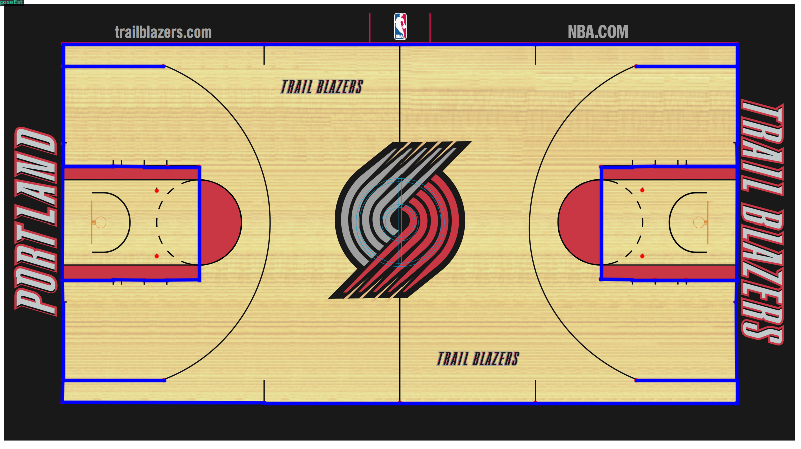

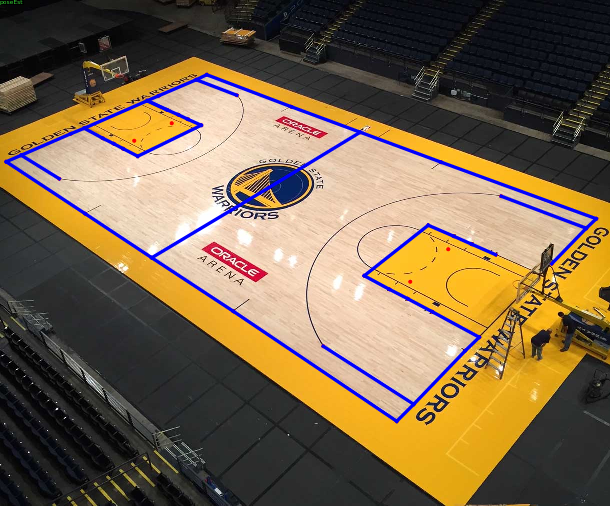

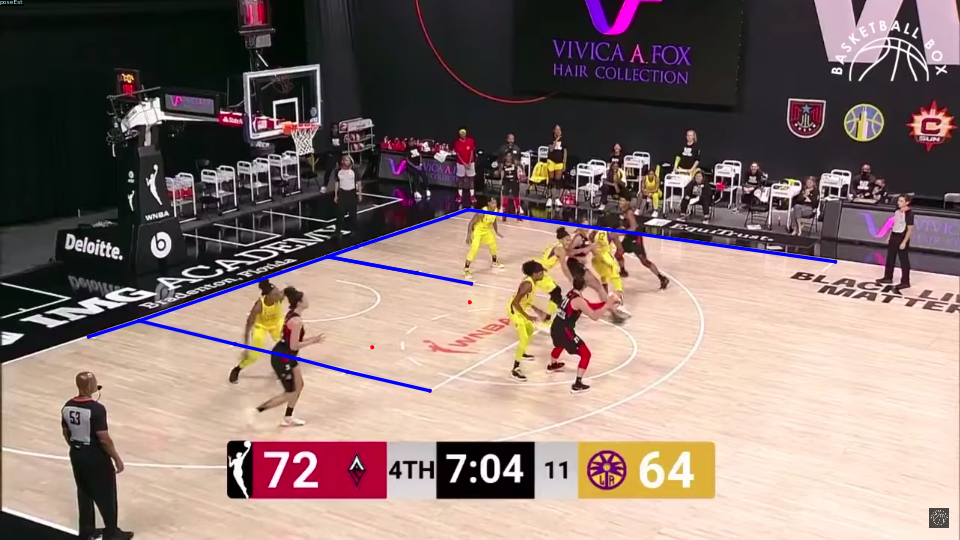

In [30]:
#DatasetCatalog.register("players_", my_train_function)
metadata.thing_classes = ["poseEst"]
metadata.keypoint_names = ["sidTopLeft0", "sidTopMiddle0", "sidBottomMiddle0", "sidBottomLeft0", "basTop3pt0",
"bas4ftTop0", "basFreeTop0", "bas3ptBottom0", "bas4ftBottom0", "basFreeBottom0", "3ptArcTop0", "3ptArcBottom0", "FreeTop1st0",
"FreeTop2nd0", "FreeTop3rd0", "FreeTop4th0", "FreeInsTop0", "FreeBottom1st0", "FreeBottom2nd0", "FreeBottom3rd0", "FreeBottom4th0",
"FreeInsBottom0", "TopCenter", "middleCenter", "bottomCenter", "sidTopLeft1", "sidTopMiddle1", "sidBottomMiddle1", "sidBottomLeft1",
"basTop3pt1", "bas4ftTop1", "basFreeTop1", "bas3ptBottom1", "bas4ftBottom1", "basFreeBottom1", "3ptArcTop1", "3ptArcBottom1", "FreeTop1st1",
"FreeTop2nd1", "FreeTop3rd1", "FreeTop4th1", "FreeInsTop1", "FreeBottom1st1", "FreeBottom2nd1", "FreeBottom3rd1", "FreeBottom4th1",
"FreeInsBottom1"]
#A list of pairs of names, where each pair are the two keypoints that should be flipped if the image is flipped horizontally during augmentation.
metadata.keypoint_flip_map = [("sidTopLeft0", "sidTopLeft1"), ("sidTopMiddle0", "sidTopMiddle1"), ("sidBottomMiddle0", "sidBottomMiddle1"), ("sidBottomLeft0", "sidBottomLeft1"), ("basTop3pt0", "basTop3pt1"),
("bas4ftTop0", "bas4ftTop1"), ("basFreeTop0", "basFreeTop1"), ("bas3ptBottom0", "bas3ptBottom1"), ("bas4ftBottom0", "bas4ftBottom1"), ("basFreeBottom0", "basFreeBottom1"),( "3ptArcTop0", "3ptArcTop1"), ("3ptArcBottom0", "3ptArcBottom1"), ("FreeTop1st0", "FreeTop1st1"),
("FreeTop2nd0", "FreeTop2nd1"), ("FreeTop3rd0", "FreeTop3rd1"), ("FreeTop4th0", "FreeTop4th1"), ("FreeInsTop0", "FreeInsTop1"), ("FreeBottom1st0", "FreeBottom1st1"), ("FreeBottom2nd0", "FreeBottom2nd1"), ("FreeBottom3rd0", "FreeBottom3rd1"), ("FreeBottom4th0", "FreeBottom4th1"),
("FreeInsBottom0","FreeInsBottom1")]
metadata.keypoint_connection_rules = [
    ["sidTopLeft0",  "basTop3pt0", (0, 0, 255)], ["sidTopLeft0", "sidTopMiddle0", (0, 0, 255)], ["basTop3pt0", "3ptArcTop0", (0,0,255)], ["basTop3pt0", "bas4ftTop0", (0,0,255)],
["bas4ftTop0", "basFreeTop0", (0, 0, 255)], ["basFreeTop0", "FreeTop1st0", (0,0,255)], ["basFreeTop0", "basFreeBottom0", (0,0,255)], ["bas3ptBottom0", "sidBottomLeft0", (0,0,255)], ["bas3ptBottom0", "bas4ftBottom0", (0,0,255)], ["bas3ptBottom0", "3ptArcBottom0", (0,0,255)], 
["bas4ftBottom0", "basFreeBottom0", (0,0,255)], ["basFreeBottom0", "FreeBottom1st0", (0,0,255)], ["FreeTop1st0", "basFreeTop0", (0,0,255)], [ "FreeTop1st0", "FreeTop2nd0",(0,0,255)], 
["FreeTop2nd0", "FreeTop3rd0", (0,0,255)], ["FreeTop3rd0", "FreeTop4th0", (0,0,255)], ["FreeTop4th0", "FreeBottom4th0", (0,0,255)], ["FreeBottom1st0", "FreeBottom2nd0", (0,0,255)], 
["FreeBottom2nd0", "FreeBottom3rd0", (0,0,255)], ["FreeBottom3rd0", "FreeBottom4th0", (0,0,255)], 
["middleCenter", "TopCenter",(0,0,255)] , ["middleCenter", "bottomCenter", (0,0,255)], ["TopCenter", "sidTopMiddle0", (0,0,255)], ["TopCenter", "sidTopMiddle1", (0,0,255)], ["sidBottomLeft0", "sidBottomMiddle0",(0,0,255)],["sidBottomLeft1", "sidBottomMiddle1",(0,0,255)] ,["bottomCenter", "sidBottomMiddle0", (0,0,255)],["bottomCenter", "sidBottomMiddle1", (0,0,255)],
["sidTopLeft1",  "basTop3pt1", (0, 0, 255)], ["sidTopLeft1", "sidTopMiddle1", (0, 0, 255)], ["basTop3pt1", "3ptArcTop1", (0,0,255)], ["basTop3pt1", "bas4ftTop1", (0,0,255)],
["bas4ftTop1", "basFreeTop1", (0, 0, 255)], ["basFreeTop1", "FreeTop1st1", (0,0,255)], ["basFreeTop1", "basFreeBottom1", (0,0,255)], ["bas3ptBottom1", "sidBottomLeft1", (0,0,255)], ["bas3ptBottom1", "bas4ftBottom1", (0,0,255)], ["bas3ptBottom1", "3ptArcBottom1", (0,0,255)], 
["bas4ftBottom1", "basFreeBottom1", (0,0,255)], ["basFreeBottom1", "FreeBottom1st1", (0,0,255)], ["FreeTop1st1", "basFreeTop1", (0,0,255)], [ "FreeTop1st1", "FreeTop2nd1",(0,0,255)], 
["FreeTop2nd1", "FreeTop3rd1", (0,0,255)], ["FreeTop3rd1", "FreeTop4th1", (0,0,255)], ["FreeTop4th1", "FreeBottom4th1", (0,0,255)], ["FreeBottom1st1", "FreeBottom2nd1", (0,0,255)], ["FreeBottom2nd1", "FreeBottom3rd1", (0,0,255)], ["FreeBottom3rd1", "FreeBottom4th1", (0,0,255)]
]

# Plotting 3 random samples
cat_train_dataset_plot = DatasetCatalog.get("p")
cat_metadata = MetadataCatalog.get("p")
for d in random.sample(cat_train_dataset_plot, 3):
    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=cat_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
# Plotting 3 random samples
cat_train_dataset_plot = DatasetCatalog.get("my_dataset")
cat_metadata = MetadataCatalog.get("my_dataset")
for d in random.sample(cat_train_dataset_plot, 1):
    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=cat_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

NameError: ignored

# Training

In [37]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("p",)
cfg.DATASETS.TEST = () #("test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 
cfg.SOLVER.BASE_LR = 0.00024
cfg.SOLVER.MAX_ITER = 50
#cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 47 
cfg.TEST.KEYPOINT_OKS_SIGMAS = [.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089,.079, .107, .089]

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

RuntimeError: ignored

# Inferences

In [32]:

cfg.MODEL.WEIGHTS = os.path.join("/content/output/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4
cfg.DATASETS.TEST = ("p", )
predictor = DefaultPredictor(cfg)


WARNING [07/19 10:31:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/19 10:31:17 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/keypoints-2.json


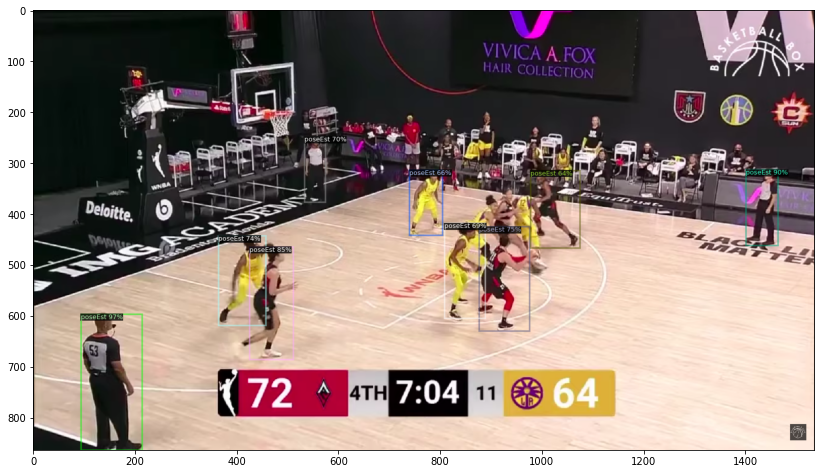

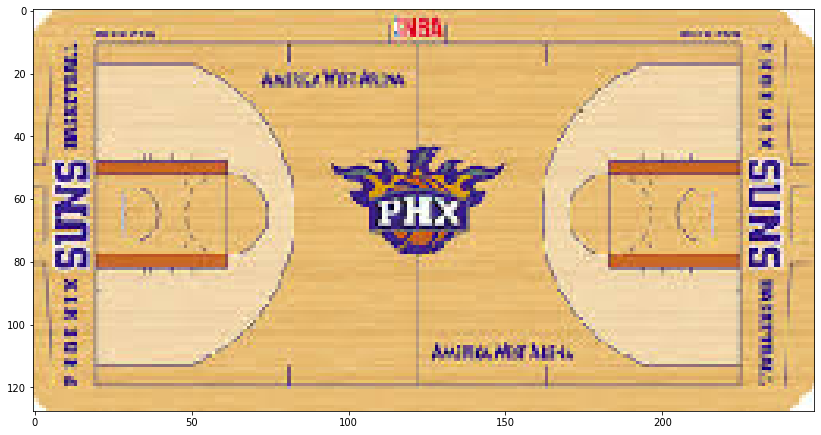

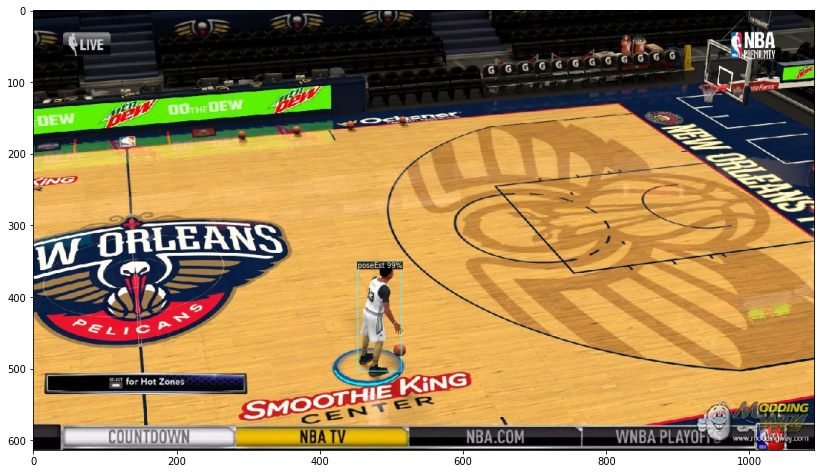

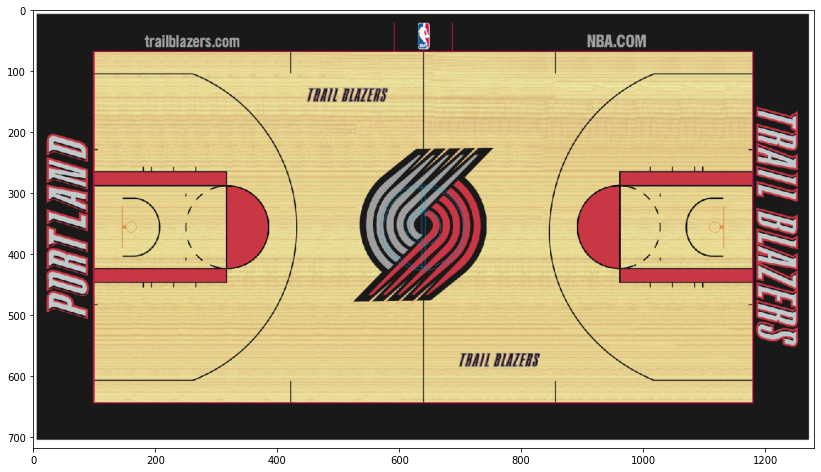

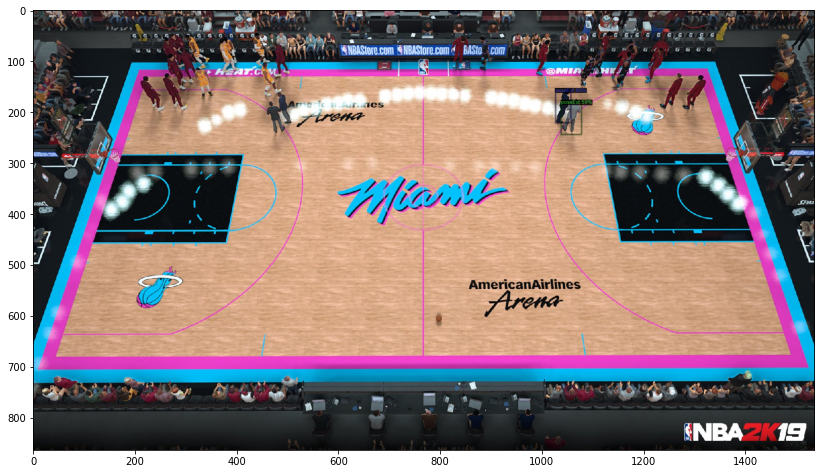

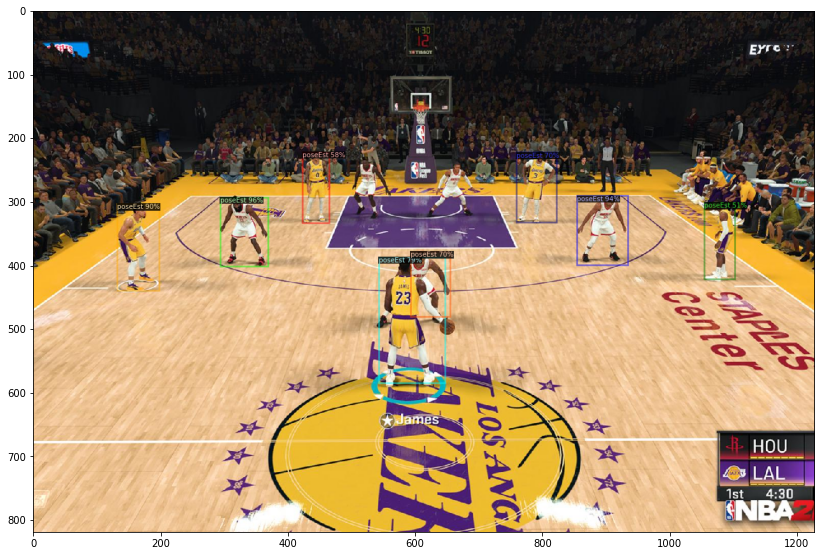

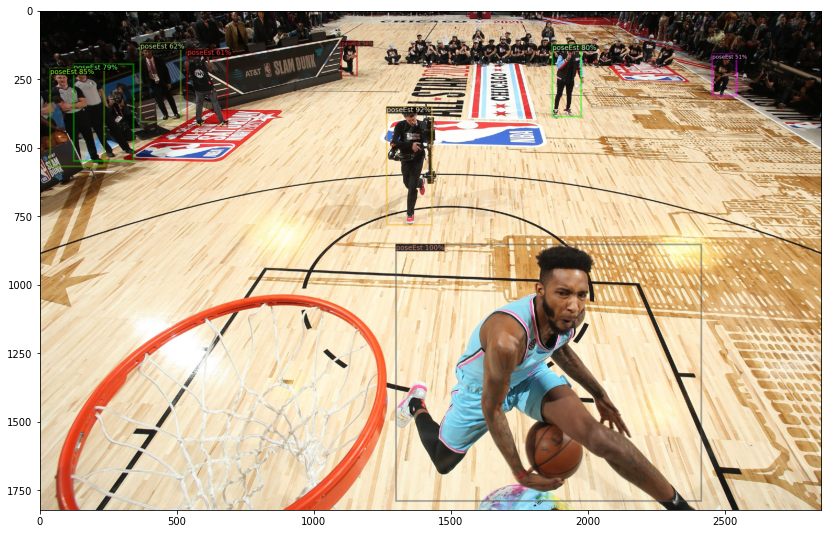

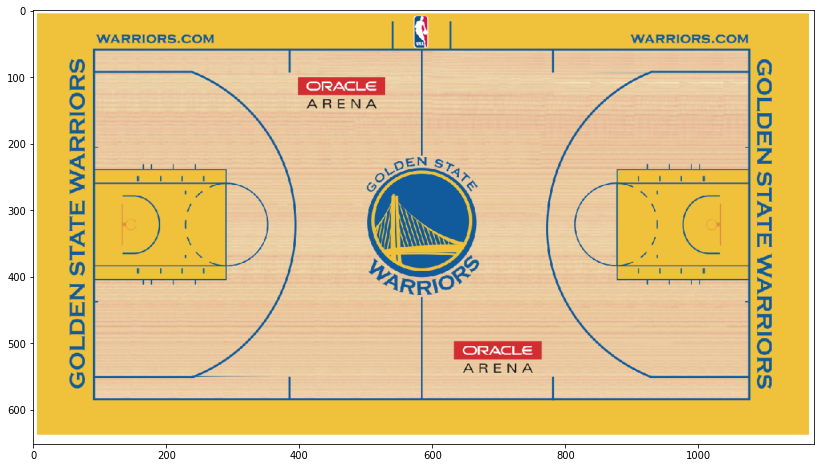

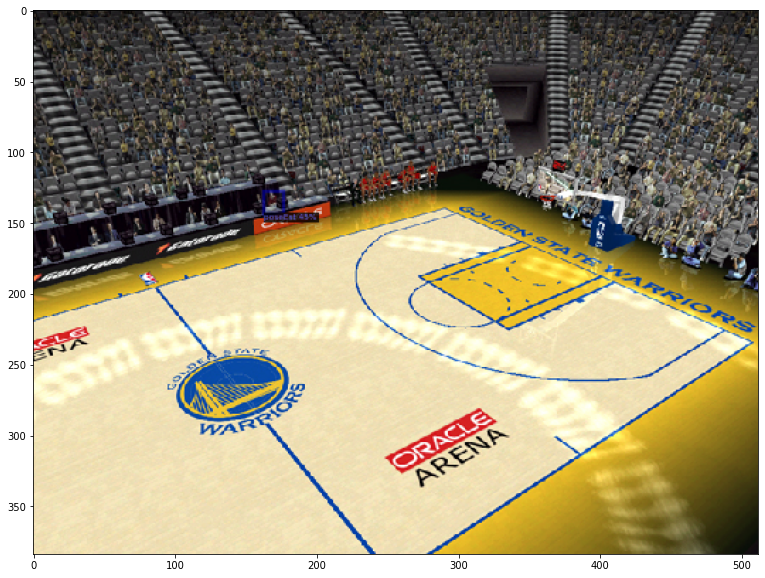

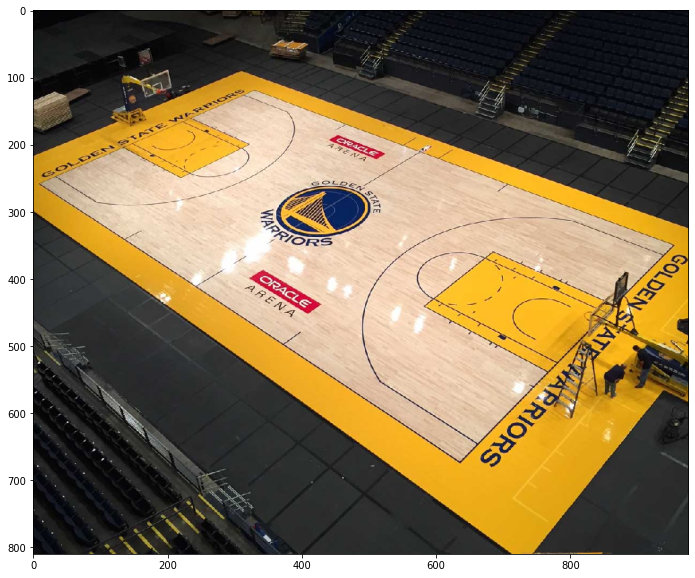

In [33]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("p")
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()
    
    f = open('/content/config.yml', 'w')
f.write(cfg.dump())
f.close()

WARNING [07/09 19:22:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/09 19:22:45 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/drive/MyDrive/consultant/PointsRemarquables dataset/keypoints/train.json


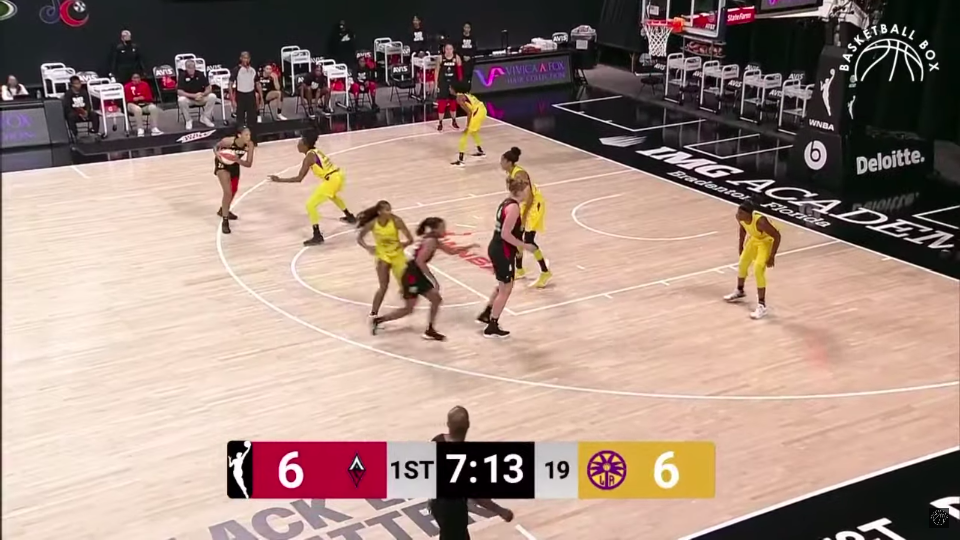

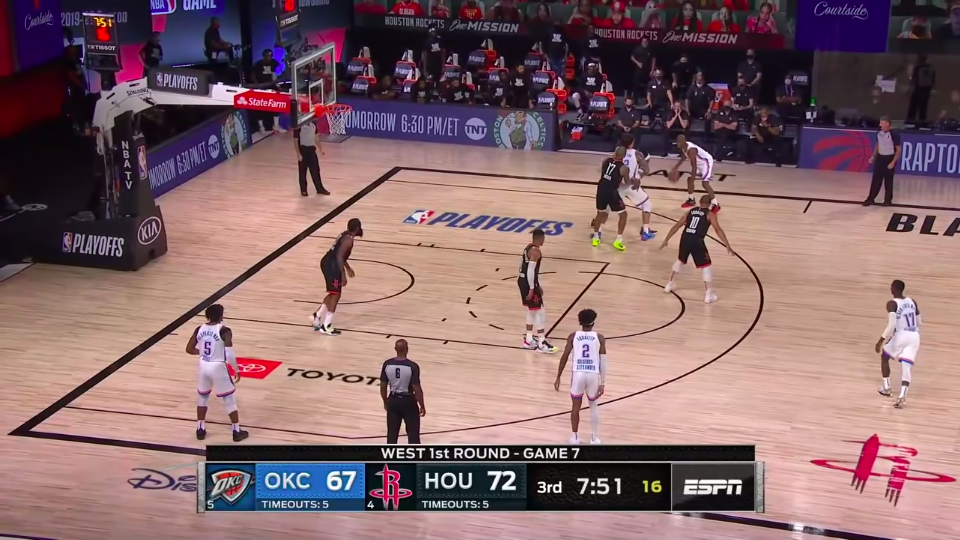

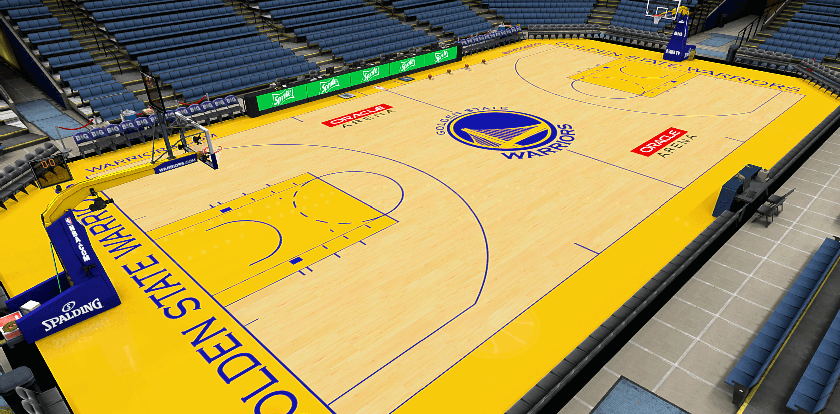

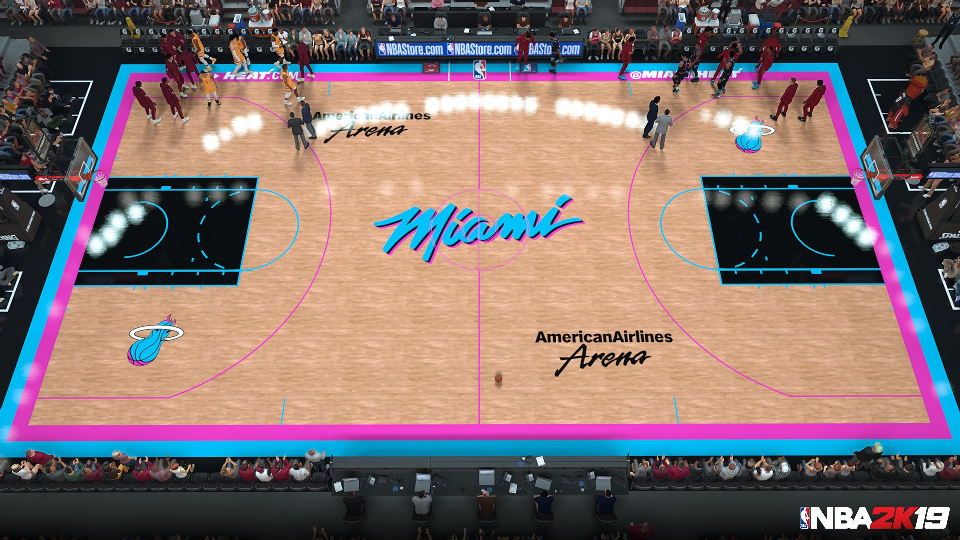

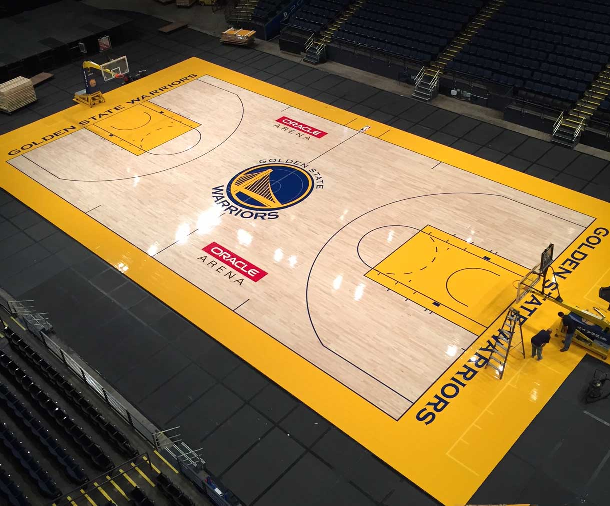

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:

cfg.MODEL.WEIGHTS = os.path.join("/content/output/model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

metadata = MetadataCatalog.get("players_")
dataset_dicts = DatasetCatalog.get("players_")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.5
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("cat_test_dataset", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "cat_test_dataset")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

In [ ]:
pwd

'/content/detectron2'

In [ ]:
!python detectron_inference.py -m "/content/output/model_final.pth" --config "/content/config.yml" -v "/content/drive/MyDrive/consultant/test/basket_vid.mp4" -sp ""

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
: cannot connect to X server 


In [ ]:
!git clone https://github.com/facebookresearch/detectron2

Cloning into 'detectron2'...
remote: Enumerating objects: 12526, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 12526 (delta 6), reused 13 (delta 5), pack-reused 12506
Receiving objects: 100% (12526/12526), 5.23 MiB | 19.48 MiB/s, done.
Resolving deltas: 100% (8963/8963), done.


In [ ]:
cd detectron2/

/content/detectron2


In [ ]:
cd /content/detectron2_repo/detectron2

/content/detectron2_repo/detectron2


In [ ]:
!python /content/detectron2/demo/demo.py --config-file /content/config.yml --video-input /content/drive/MyDrive/consultant/test/kuz.mp4 --confidence-threshold 0.7 --output video-output8.mp4 --opts MODEL.WEIGHTS /content/output/model_final.pth

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
: cannot connect to X server 
